In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os  # For interacting with the operating system
import sys  # For system-specific parameters and functions
import math  # For mathematical functions
import random  # For generating random numbers
import datetime  # For manipulating dates and times
import time  # For measuring time and delaying code execution
import csv  # For reading and writing CSV files
import re  # For working with regular expressi

# Load the CSV file into a DataFrame
data = pd.read_csv('StackOverflow_DataRepository.csv')

data

,Index,Question Title,Question Body,Question Upvote,Question View Count,Question Creation Date,Question Last Activity Date,Answers,Number of Answers,Service Name
0,1,Is it possible to discover and run third-party...,I'm currently trying to learn about Android in...,13,1377,2017-08-02 20:28:48,2017-08-11 07:14:29,\n Is it possible to discover and open third-...,2,Australia post api
1,2,PHP date() returning format yyyy-mm-ddThh:mm:s...,I have checked out the following question/resp...,10,33743,2014-07-07 17:45:12,2022-05-09 03:22:12,Z stands for the timezone UTC and is defined i...,2,Australia post api
2,3,$jsonObj data not being passed via ajax and PO...,I'm trying to pass data via post with ajax to ...,9,825,2017-09-01 12:02:29,2017-11-13 23:40:26,"UPDATE 2\n\nYour code here uses items, not ite...",1,Australia post api
3,4,Classify or keyword match a natural language s...,"This is my first post on StackOverflow, so apo...",9,1580,2012-09-20 21:30:20,2012-10-18 03:59:47,I noticed in the comments you're trying out th...,3,Australia post api
4,5,I don&#39;t understand how Westpac Payway API ...,"Been googling all day, reading numerous PDF's ...",8,3987,2010-05-07 10:01:28,2016-02-26 12:35:29,There are a number of different ways to intera...,3,Australia post api
...,...,...,...,...,...,...,...,...,...,...
1787,1788,Having Trouble returning large number of rows ...,I am brand new to PostgreSql and I am having t...,0,941,2018-05-02 09:33:01,2018-05-02 16:12:51,NaN,0,Data Archive Australia
1788,1789,PostgreSQL 13 sometimes works but sometimes hu...,I have PostgreSQL implemented in my Python cod...,0,960,2021-03-23 00:43:02,2021-07-23 06:23:36,Might be little late but check out answer on h...,1,Data Archive Australia
1789,1790,Terraform loop over list of objects in dynamic...,I am trying to create a storage bucket in GCP ...,0,743,2022-11-09 16:34:14,2022-11-10 11:15:41,Your for_each is incorrect. It should be:\n d...,1,Data Archive Australia
1790,1791,PERFORMANCE PROBLEM IN POSTGRES (SLOW IN QUERIES),I have been having an inconvenience for severa...,-2,3807,2022-03-20 06:10:58,2022-03-20 12:38:37,The plan is using img_products_unicas as the d...,1,Data Archive Australia


In [3]:
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1792 entries, 0 to 1791
Data columns (total 10 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   Index                        1792 non-null   int64 
 1   Question Title               1792 non-null   object
 2   Question Body                1792 non-null   object
 3   Question Upvote              1792 non-null   int64 
 4   Question View Count          1792 non-null   int64 
 5   Question Creation Date       1792 non-null   object
 6   Question Last Activity Date  1792 non-null   object
 7   Answers                      1515 non-null   object
 8   Number of Answers            1792 non-null   int64 
 9   Service Name                 1792 non-null   object
dtypes: int64(4), object(6)
memory usage: 140.1+ KB


In [4]:
duplicate_records = data.duplicated().sum()
duplicate_records

# Remove duplicate records if any
data = data.drop_duplicates()


In [5]:
data.info()



<class 'pandas.core.frame.DataFrame'>
Int64Index: 1792 entries, 0 to 1791
Data columns (total 10 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   Index                        1792 non-null   int64 
 1   Question Title               1792 non-null   object
 2   Question Body                1792 non-null   object
 3   Question Upvote              1792 non-null   int64 
 4   Question View Count          1792 non-null   int64 
 5   Question Creation Date       1792 non-null   object
 6   Question Last Activity Date  1792 non-null   object
 7   Answers                      1515 non-null   object
 8   Number of Answers            1792 non-null   int64 
 9   Service Name                 1792 non-null   object
dtypes: int64(4), object(6)
memory usage: 154.0+ KB


In [6]:
# Group by service and calculate summary statistics
service_summary = data.groupby('Service Name').agg({
    'Index': 'count',
    'Question Upvote': 'sum',
    'Question View Count': 'sum',
    'Number of Answers': 'sum'
}).rename(columns={'Index': 'Number of Questions'}).reset_index()

service_summary = service_summary.sort_values(by='Number of Questions', ascending=False)
service_summary.head(10)


,Service Name,Number of Questions,Question Upvote,Question View Count,Number of Answers
9,Australia Post,596,423,808880,796
0,AUS POST,383,343,714628,461
12,Australia post api,84,112,134822,92
11,Australia in the Asia-Pacific,83,223,180407,103
6,Australia Government,67,42,54348,87
101,National Map Australia,51,26,90276,70
107,Services Victoria,41,38,68472,51
2,Australia Covid 19,32,19,33195,30
88,Data Archive Australia,27,28,105279,30
71,Australian Stock Exchange,27,67,93821,41


In [7]:
###EDA

In [8]:
# Summary statistics for numerical columns
descriptive_stats = data.describe()
descriptive_stats


,Index,Question Upvote,Question View Count,Number of Answers
count,1792.000000,1792.000000,1792.000000,1792.000000
mean,896.500000,0.897321,1572.450335,1.283482
std,517.450159,3.153181,5339.319442,1.000835
min,1.000000,-7.000000,6.000000,0.000000
25%,448.750000,0.000000,112.000000,1.000000
50%,896.500000,0.000000,395.500000,1.000000
75%,1344.250000,1.000000,1151.500000,2.000000
max,1792.000000,74.000000,140942.000000,15.000000


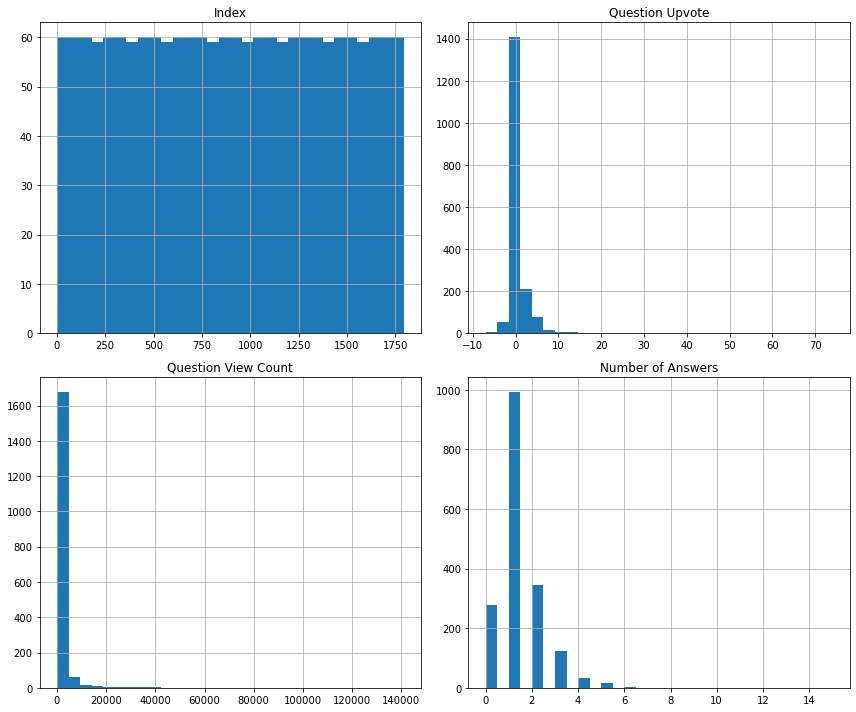

In [9]:
import matplotlib.pyplot as plt

# Histograms for numerical columns
data.hist(figsize=(12, 10), bins=30)
plt.tight_layout()
plt.show()


In [10]:
# Distribution of questions across top questioned services
service_counts = data['Service Name'].value_counts()
service_counts.head(10)


Australia Post                   596
AUS POST                         383
Australia post api                84
Australia in the Asia-Pacific     83
Australia Government              67
National Map Australia            51
Services Victoria                 41
Australia Covid 19                32
Australian Stock Exchange         27
Data Archive Australia            27
Name: Service Name, dtype: int64

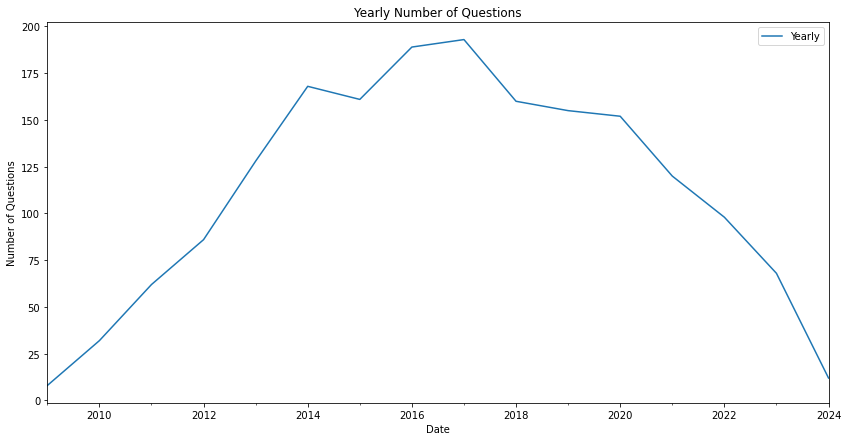

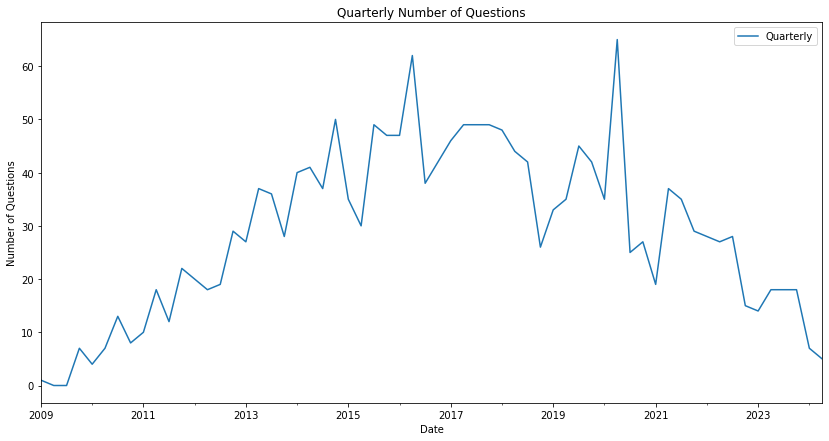

In [11]:
# Ensure 'Question Creation Date' is in datetime format
data['Question Creation Date'] = pd.to_datetime(data['Question Creation Date'])

# Set 'Question Creation Date' as the index
data.set_index('Question Creation Date', inplace=True)

# Resample data by year and quarter
yearly_trends = data.resample('Y').size()
quarterly_trends = data.resample('Q').size()

# Plot trends
plt.figure(figsize=(14, 7))
yearly_trends.plot(label='Yearly')
plt.title('Yearly Number of Questions')
plt.xlabel('Date')
plt.ylabel('Number of Questions')
plt.legend()
plt.show()

plt.figure(figsize=(14, 7))
quarterly_trends.plot(label='Quarterly')
plt.title('Quarterly Number of Questions')
plt.xlabel('Date')
plt.ylabel('Number of Questions')
plt.legend()
plt.show()


             Index  Question Upvote  Question View Count  Number of Answers
count  1792.000000      1792.000000          1792.000000        1792.000000
mean    896.500000         0.897321          1572.450335           1.283482
std     517.450159         3.153181          5339.319442           1.000835
min       1.000000        -7.000000             6.000000           0.000000
25%     448.750000         0.000000           112.000000           1.000000
50%     896.500000         0.000000           395.500000           1.000000
75%    1344.250000         1.000000          1151.500000           2.000000
max    1792.000000        74.000000        140942.000000          15.000000


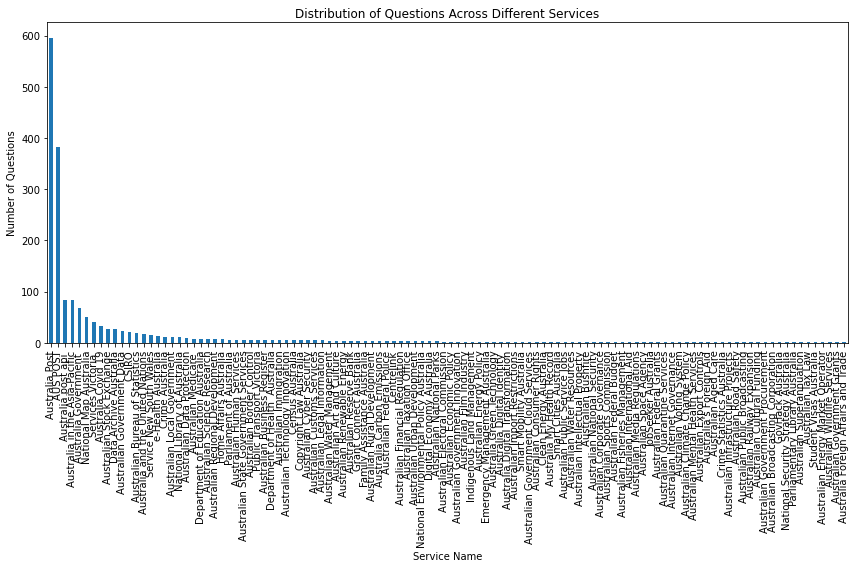

In [12]:
import matplotlib.pyplot as plt

# Basic statistics for numeric columns
basic_stats = data.describe()
print(basic_stats)

# Service distribution
service_distribution = data['Service Name'].value_counts()

# Plot service distribution
plt.figure(figsize=(12, 8))
service_distribution.plot(kind='bar')
plt.title('Distribution of Questions Across Different Services')
plt.xlabel('Service Name')
plt.ylabel('Number of Questions')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()



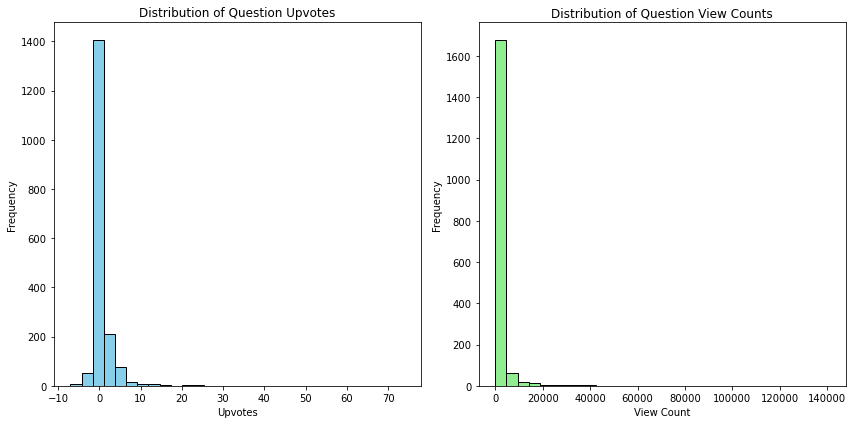

In [13]:
# Plot histograms for upvotes and view counts
plt.figure(figsize=(12, 6))

# Question Upvotes
plt.subplot(1, 2, 1)
plt.hist(data['Question Upvote'], bins=30, color='skyblue', edgecolor='black')
plt.title('Distribution of Question Upvotes')
plt.xlabel('Upvotes')
plt.ylabel('Frequency')

# Question View Count
plt.subplot(1, 2, 2)
plt.hist(data['Question View Count'], bins=30, color='lightgreen', edgecolor='black')
plt.title('Distribution of Question View Counts')
plt.xlabel('View Count')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


In [19]:
'''
Observations from Histograms
Question Upvotes:

Most questions have low upvotes, with a significant number of questions having zero upvotes.
There are a few questions with a high number of upvotes, indicating some outliers.
Question View Counts:

The distribution of view counts is right-skewed, with many questions having fewer views and a few questions having extremely high view counts.

'''

'\nObservations from Histograms\nQuestion Upvotes:\n\nMost questions have low upvotes, with a significant number of questions having zero upvotes.\nThere are a few questions with a high number of upvotes, indicating some outliers.\nQuestion View Counts:\n\nThe distribution of view counts is right-skewed, with many questions having fewer views and a few questions having extremely high view counts.\n\n'

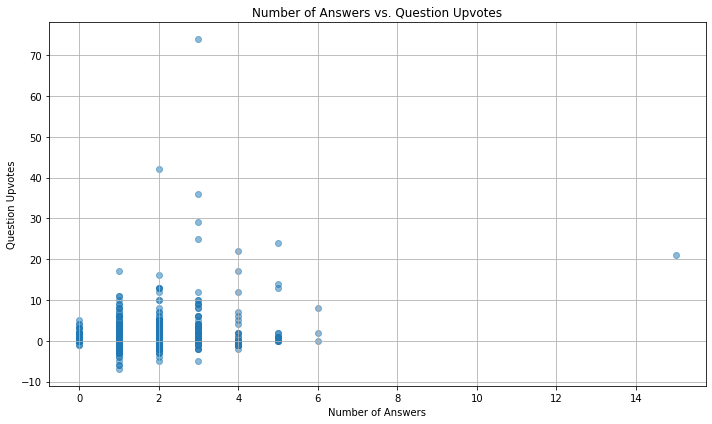

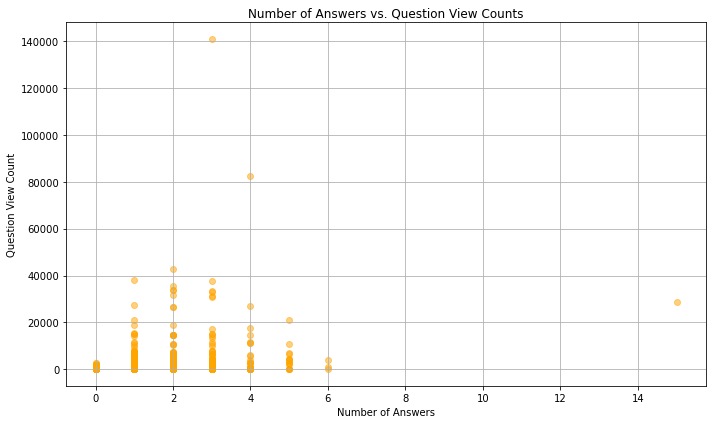

In [20]:
# Analyse the relationship between number of answers and other variables

# Scatter plot of Number of Answers vs. Question Upvote
plt.figure(figsize=(10, 6))
plt.scatter(data['Number of Answers'], data['Question Upvote'], alpha=0.5)
plt.title('Number of Answers vs. Question Upvotes')
plt.xlabel('Number of Answers')
plt.ylabel('Question Upvotes')
plt.grid(True)
plt.tight_layout()
plt.show()

# Scatter plot of Number of Answers vs. Question View Count
plt.figure(figsize=(10, 6))
plt.scatter(data['Number of Answers'], data['Question View Count'], alpha=0.5, color='orange')
plt.title('Number of Answers vs. Question View Counts')
plt.xlabel('Number of Answers')
plt.ylabel('Question View Count')
plt.grid(True)
plt.tight_layout()
plt.show()


In [21]:
'''
Observations from Answer Analysis
1. Number of Answers vs. Question Upvotes:
There is a positive correlation between the number of answers and the number of upvotes, indicating that questions with more answers tend to receive more upvotes.
1. Number of Answers vs. Question View Counts:
There is a positive correlation between the number of answers and the number of view counts, suggesting that questions with more answers are viewed more frequently.
'''


'\nObservations from Answer Analysis\n1. Number of Answers vs. Question Upvotes:\nThere is a positive correlation between the number of answers and the number of upvotes, indicating that questions with more answers tend to receive more upvotes.\n1. Number of Answers vs. Question View Counts:\nThere is a positive correlation between the number of answers and the number of view counts, suggesting that questions with more answers are viewed more frequently.\n'

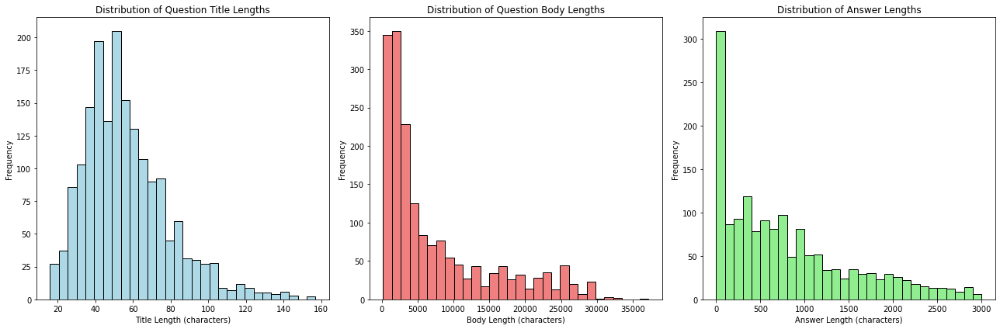

In [28]:
import matplotlib.pyplot as plt

# Calculate lengths
data['Title Length'] = data['Question Title'].apply(len)
data['Body Length'] = data['Question Body'].apply(len)
data['Answer Length'] = data['Answers'].apply(lambda x: len(x) if isinstance(x, str) else 0)

# Plotting question title, body, and answer length distributions
plt.figure(figsize=(18, 6))

# Question Title Lengths
plt.subplot(1, 3, 1)
plt.hist(data['Title Length'], bins=30, color='lightblue', edgecolor='black')
plt.title('Distribution of Question Title Lengths')
plt.xlabel('Title Length (characters)')
plt.ylabel('Frequency')

# Question Body Lengths
plt.subplot(1, 3, 2)
plt.hist(data['Body Length'], bins=30, color='lightcoral', edgecolor='black')
plt.title('Distribution of Question Body Lengths')
plt.xlabel('Body Length (characters)')
plt.ylabel('Frequency')

# Answer Lengths
plt.subplot(1, 3, 3)
plt.hist(data['Answer Length'], bins=30, range=(0, 3000), color='lightgreen', edgecolor='black')
plt.title('Distribution of Answer Lengths')
plt.xlabel('Answer Length (characters)')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


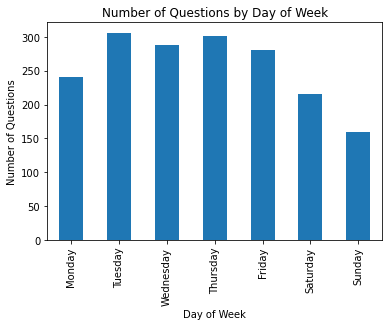

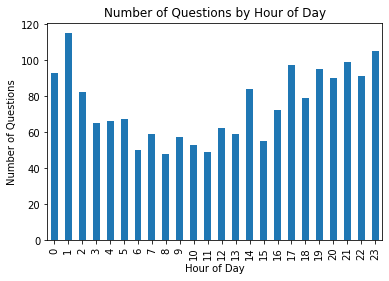

In [27]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure the 'Question Last Activity Date' is in datetime format
data['Question Last Activity Date'] = pd.to_datetime(data['Question Last Activity Date'])

# Weekly patterns
data['Day of Week'] = data['Question Last Activity Date'].dt.day_name()
weekly_patterns = data['Day of Week'].value_counts().reindex([
    'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'
])

weekly_patterns.plot(kind='bar', title='Number of Questions by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Number of Questions')
plt.show()

# Daily patterns
data['Hour'] = data['Question Last Activity Date'].dt.hour
hourly_patterns = data['Hour'].value_counts().sort_index()

hourly_patterns.plot(kind='bar', title='Number of Questions by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Questions')
plt.show()


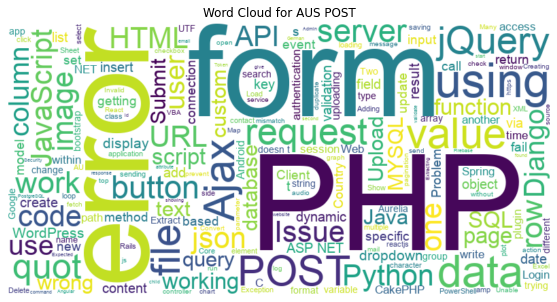

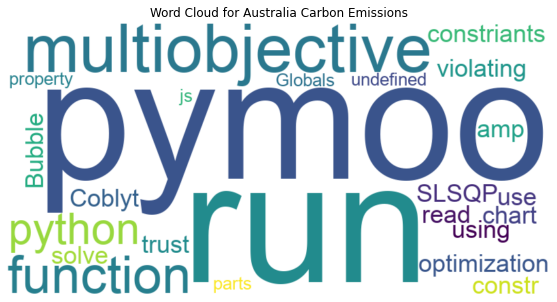

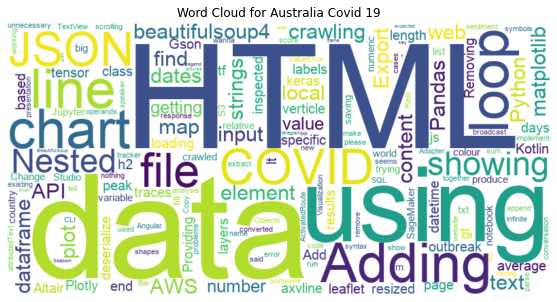

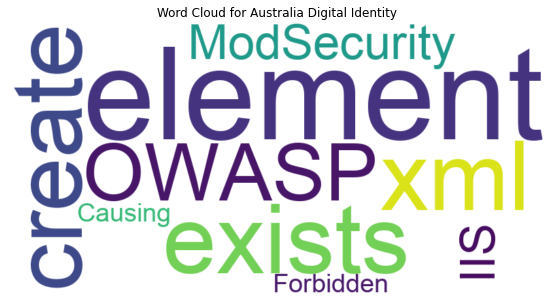

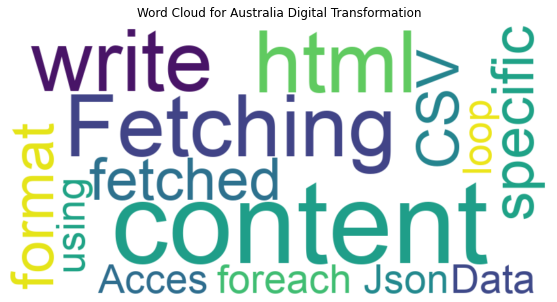

...

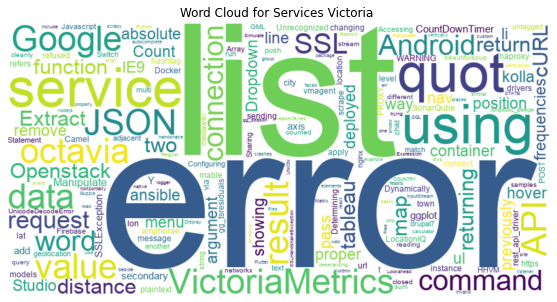

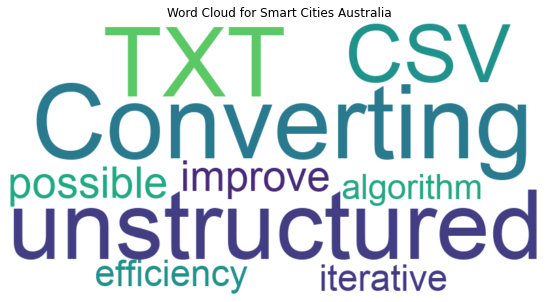

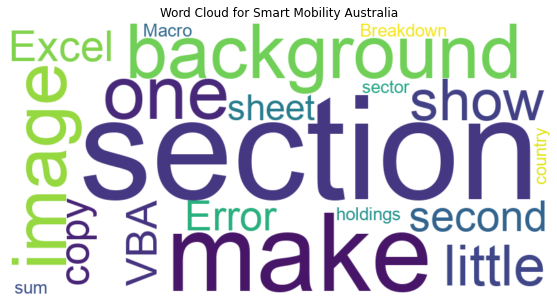

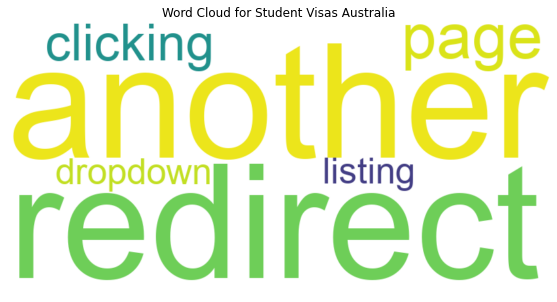

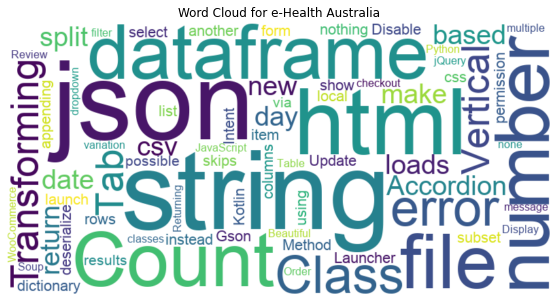

In [29]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Path to the Arial.ttf font file
font_path = '/Users/sinaroman/Arial.ttf'

# Generate word clouds for each service
service_specific_topics = data.groupby('Service Name')['Question Title'].apply(lambda titles: ' '.join(titles))
for service, titles in service_specific_topics.items():
    wordcloud = WordCloud(width=800, height=400, background_color='white', font_path=font_path).generate(titles)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {service}')
    plt.axis('off')
    plt.show()



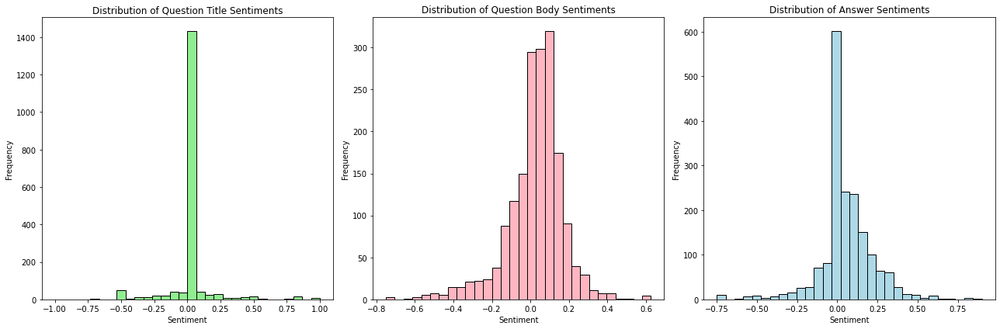

In [44]:
from textblob import TextBlob
import matplotlib.pyplot as plt

# Ensure the 'Answers' column is cleaned and processed
data['Answers'] = data['Answers'].apply(lambda x: x if isinstance(x, str) else '')

# Sentiment analysis
data['Title Sentiment'] = data['Question Title'].apply(lambda text: TextBlob(text).sentiment.polarity)
data['Body Sentiment'] = data['Question Body'].apply(lambda text: TextBlob(text).sentiment.polarity)
data['Answer Sentiment'] = data['Answers'].apply(lambda text: TextBlob(text).sentiment.polarity)

# Plot sentiment distribution
plt.figure(figsize=(18, 6))

# Distribution of Question Title Sentiments
plt.subplot(1, 3, 1)
plt.hist(data['Title Sentiment'], bins=30, color='lightgreen', edgecolor='black')
plt.title('Distribution of Question Title Sentiments')
plt.xlabel('Sentiment')
plt.ylabel('Frequency')

# Distribution of Question Body Sentiments
plt.subplot(1, 3, 2)
plt.hist(data['Body Sentiment'], bins=30, color='lightpink', edgecolor='black')
plt.title('Distribution of Question Body Sentiments')
plt.xlabel('Sentiment')
plt.ylabel('Frequency')

# Distribution of Answer Sentiments
plt.subplot(1, 3, 3)
plt.hist(data['Answer Sentiment'], bins=30, color='lightblue', edgecolor='black')
plt.title('Distribution of Answer Sentiments')
plt.xlabel('Sentimaent')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


In [39]:
'''
Question Titles: Predominantly neutral, suggesting that titles are straightforward and to the point without much emotional tone.
Question Bodies: Display a range of sentiments, but still mostly centered around neutral, indicating balanced expressions of sentiment with slight variations towards positive and negative.
'''

'\nQuestion Titles: Predominantly neutral, suggesting that titles are straightforward and to the point without much emotional tone.\nQuestion Bodies: Display a range of sentiments, but still mostly centered around neutral, indicating balanced expressions of sentiment with slight variations towards positive and negative.\n'